In [1]:
import numpy as np
import scanpy as sc
import pandas as pd
import os
import pandas as pd
import gc
import dask.dataframe

In [2]:
os.chdir("E:\\Xenopus\\Xenopus _DGE")

In [4]:
adata=sc.read("pbmc3k.h5ad")

In [6]:
adata

AnnData object with n_obs × n_vars = 501358 × 3000
    obs: 'nCount_RNA', 'nFeature_RNA', 'tissue', 'batch', 'date', 'leiden', 'anno', 'anno2'
    uns: 'batch_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_tsne'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [6]:
aa=adata.X.todense()

In [7]:
aa=pd.DataFrame(aa)

In [8]:
aa.index=adata.obs_names
aa.columns=adata.var_names

In [9]:
a2=adata.obs

In [10]:
adata=sc.AnnData(aa)

In [11]:
adata.obs=a2

In [12]:
sc.tl.pca(adata, svd_solver='arpack',n_comps=100)

In [13]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=100)

In [14]:
sc.tl.leiden(adata, resolution=1)

In [15]:
sc.tl.tsne(adata,n_pcs=100)

In [10]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=300,dpi_save=400, facecolor='white')

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.2 scipy==1.5.2 pandas==1.2.4 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.8.3 leidenalg==0.8.3


In [69]:
leiden=pd.read_csv("metadata_21210907.csv")

In [70]:
leiden

,Unnamed: 0,pbmc.leiden,pbmc.tissue,pbmc.stage,pbmc.batch,pbmc.anno,pbmc.anno2
0,Bladder1_2.01.TGCGGATGATCATGATCA,58,Bladder,Adult,Bladder1,Erythrocyte,Erythrocyte
1,Bladder1_2.01.ACAATAGTGGTACTGTGT,86,Bladder,Adult,Bladder1,B cell,Immune
2,Bladder1_2.01.TGATCAAAGCGGCACAAG,73,Bladder,Adult,Bladder1,B cell,Immune
3,Bladder1_2.01.CGAGTATGGATGGACACT,73,Bladder,Adult,Bladder1,B cell,Immune
4,Bladder1_2.01.GCGAATTATTGTTGAAGC,73,Bladder,Adult,Bladder1,B cell,Immune
...,...,...,...,...,...,...,...
501353,St66_5.TCACTTTCGGGTGCGTGC,32,St66,ST,St66,Stomach Parietal cell,Epithelial
501354,St66_5.TTCATATCAAAGGCGTGC,21,St66,ST,St66,Enterocyte,Epithelial
501355,St66_5.TGATCAGCGAATCGTTTC,32,St66,ST,St66,Stomach Parietal cell,Epithelial
501356,St66_5.GTAATGAAAGTTGCGTGC,21,St66,ST,St66,Enterocyte,Epithelial


In [39]:
leiden["leiden"]=leiden["leiden"].astype("string")

In [40]:
adata.obs["leiden"]=leiden["leiden"].values

In [41]:
adata.obs["tissue"]=leiden["tissue"].values

In [42]:
adata.obs["batch"]=leiden["batch"].values

In [71]:
adata.obs["anno"]=leiden["pbmc.anno"].values

In [79]:
adata.obs["annouse"]=leiden["pbmc.anno"].values

In [72]:
adata.obs["anno2"]=leiden["pbmc.anno2"].values

In [24]:
adata.uns["leiden_colors"]=pd.read_csv("col106.csv")["x"].values

... storing 'tissue' as categorical
... storing 'batch' as categorical
... storing 'anno' as categorical
... storing 'anno2' as categorical


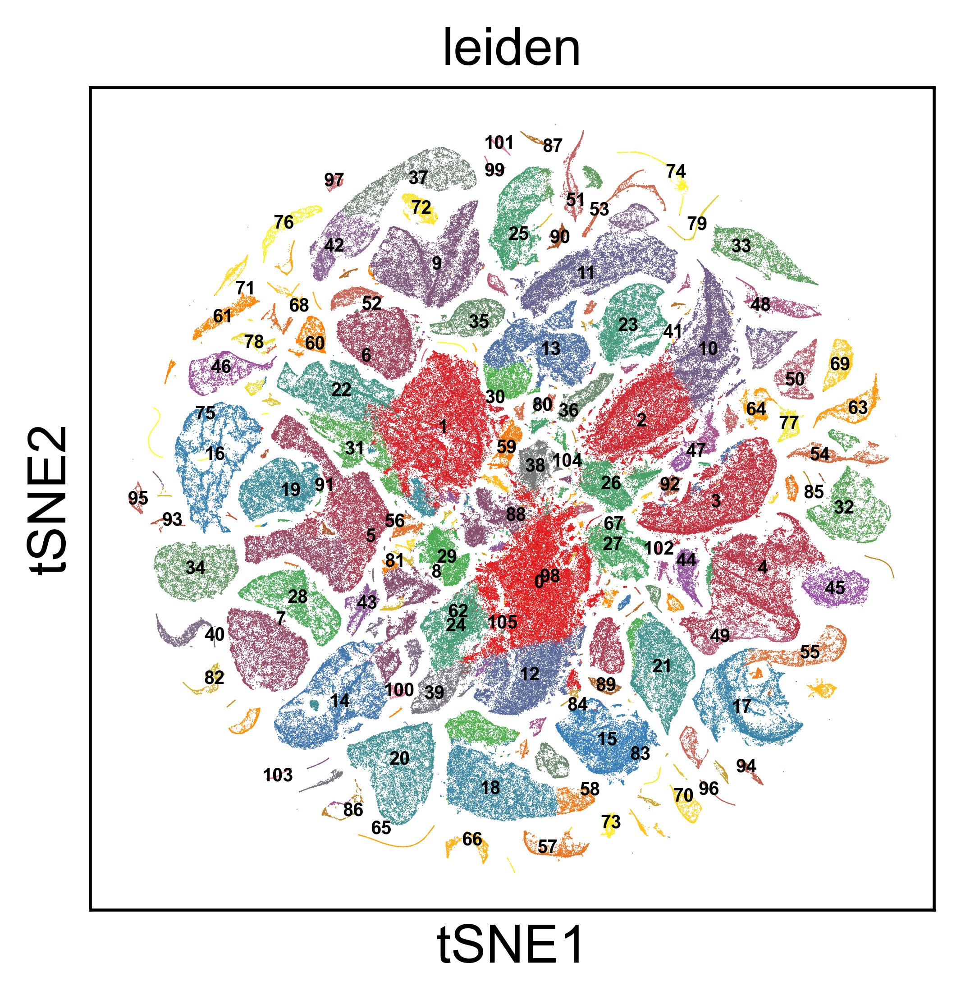

In [40]:
sc.pl.tsne(adata, color=['leiden'],save='leiden.pdf',legend_fontsize=5,legend_loc="on data")

In [62]:
adata.uns["batch_colors"]=pd.read_csv("col31.csv")["x"].values

In [54]:
adata.uns["tissue_colors"]=pd.read_csv("col21.csv")["x"].values

In [11]:
adata.uns["anno2_colors"]=pd.read_csv("col12.csv")["x"].values

In [34]:
adata.uns["anno_colors"]=pd.read_csv("col47.csv")["x"].values

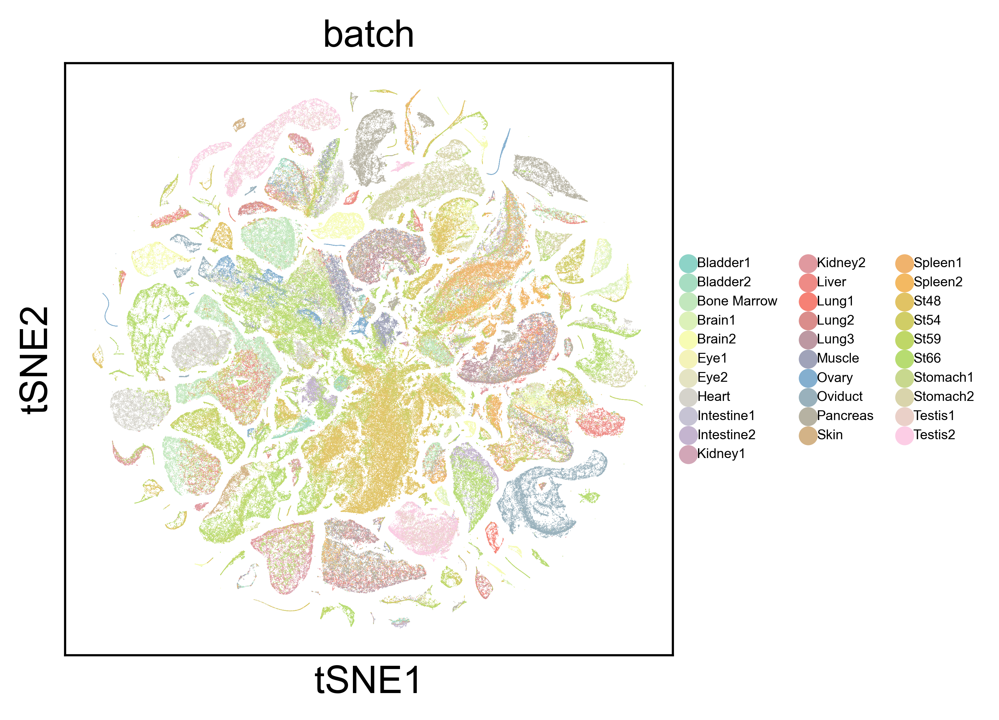

In [63]:
sc.pl.tsne(adata, color=['batch'],save='batch.pdf',legend_fontsize=5)

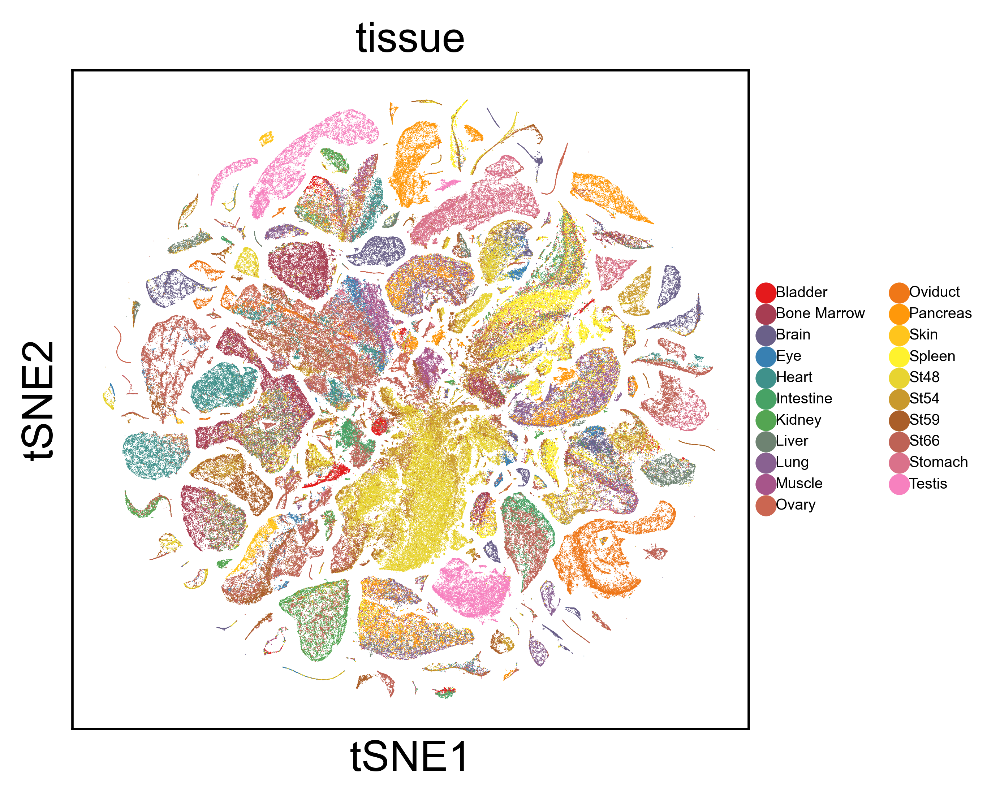

In [25]:
sc.pl.tsne(adata, color=['tissue'],save='tissue.pdf',legend_fontsize=5)

In [5]:
adata

AnnData object with n_obs × n_vars = 501358 × 3000
    obs: 'nCount_RNA', 'nFeature_RNA', 'tissue', 'batch', 'date', 'leiden', 'anno', 'anno2'
    uns: 'anno2_colors', 'anno_colors', 'batch_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'tissue_colors'
    obsm: 'X_pca', 'X_tsne'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [36]:
sc.tl.rank_genes_groups(adata, 'anno', method='t-test')

ranking genes


C:\Users\ggj\anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:06:27)


In [ ]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'logfoldchanges','scores', 'pvals_adj']}).to_csv("annomarker.csv")

In [93]:
adata.write("Xscanpy.h5ad",compression=True)